In [31]:
%run /home/jupyter/datasphere/project/RSVbaseline/experiments/constantBaseline/main.py

Device is: cuda
Splitting train val test...
365 365 wrf/era file numbers
/home/jupyter/datasphere/project/train/wrf/wrfout_d01_2019-01-01_00%3A00%3A00.npy /home/jupyter/datasphere/project/train/wrf/wrfout_d01_2019-12-31_00%3A00%3A00.npy
/home/jupyter/datasphere/project/train/era5/era_uv10_t2_2019-01-01.npy /home/jupyter/datasphere/project/train/era5/era_uv10_t2_2019-12-31.npy
Using dates from 2019-01-01 to 2019-12-31
Split completed!
256 wrf_files
256 era_files
36 wrf_files
36 era_files


  0%|          | 0/256 [00:00<?, ?it/s]

train data size torch.Size([4, 24, 3, 210, 280])
train label size torch.Size([4, 24, 3, 67, 215])


  0%|          | 0/256 [00:01<?, ?it/s]


TypeError: ConstantBias.forward() missing 1 required positional argument: 'seasonal_component'

In [3]:
import numpy as np
import matplotlib.pyplot as plt
import statsmodels.api as sm

In [4]:
# Папка с файлами
folder_path = '/home/jupyter/datasphere/project/train/era5'

# Задаем параметры скользящего среднего
window_size = 3  # Размер окна скользящего среднего

# Создаем функцию для применения скользящего среднего
def moving_average(data, window_size):
    """
    Применяет скользящее среднее к каждому из каналов данных.
    """
    result = np.copy(data)  # Создаем копию данных, чтобы не изменять оригинал
    
    # Применяем скользящее среднее к каждому каналу
    for i in range(data.shape[1]):  # Цикл по каналам
        result[:, i, :, :] = np.apply_along_axis(
            lambda x: np.convolve(x, np.ones(window_size)/window_size, mode='same'),
            axis=0,
            arr=data[:, i, :, :]
        )

    return result

# Список для хранения сезонных компонентов
all_seasonal_components_era5 = []

# Загружаем данные и собираем сезонные компоненты для каждого файла
for file_name in os.listdir(folder_path):
    if file_name.endswith(".npy"):
        file_path = os.path.join(folder_path, file_name)
        print(file_name)
        
        # Загрузка данных
        data = np.load(file_path)

        # Применяем скользящее среднее
        smoothed_data = moving_average(data, window_size)

        # Получаем тренд как среднее значение по времени
        trend = smoothed_data.mean(axis=0)

        # Получаем сезонную компоненту вычитанием тренда
        seasonal_component = smoothed_data - trend[np.newaxis, :, :, :]

        # Добавляем в общий список
        all_seasonal_components_era5.append(seasonal_component)

# Собираем сезонные компоненты в один массив
all_seasonal_components_era5 = np.array(all_seasonal_components_era5)

era_uv10_t2_2019-01-04.npy
era_uv10_t2_2019-01-02.npy
era_uv10_t2_2019-01-08.npy
era_uv10_t2_2019-01-09.npy
era_uv10_t2_2019-01-05.npy
era_uv10_t2_2019-01-12.npy
era_uv10_t2_2019-01-10.npy
era_uv10_t2_2019-01-13.npy
era_uv10_t2_2019-01-11.npy
era_uv10_t2_2019-01-15.npy
era_uv10_t2_2019-01-17.npy
era_uv10_t2_2019-01-14.npy
era_uv10_t2_2019-01-18.npy
era_uv10_t2_2019-01-16.npy
era_uv10_t2_2019-01-19.npy
era_uv10_t2_2019-01-20.npy
era_uv10_t2_2019-01-23.npy
era_uv10_t2_2019-01-30.npy
era_uv10_t2_2019-01-22.npy
era_uv10_t2_2019-01-24.npy
era_uv10_t2_2019-01-29.npy
era_uv10_t2_2019-01-21.npy
era_uv10_t2_2019-01-07.npy
era_uv10_t2_2019-01-25.npy
era_uv10_t2_2019-02-05.npy
era_uv10_t2_2019-01-06.npy
era_uv10_t2_2019-01-27.npy
era_uv10_t2_2019-02-01.npy
era_uv10_t2_2019-02-09.npy
era_uv10_t2_2019-01-31.npy
era_uv10_t2_2019-02-15.npy
era_uv10_t2_2019-02-04.npy
era_uv10_t2_2019-02-06.npy
era_uv10_t2_2019-01-28.npy
era_uv10_t2_2019-02-02.npy
era_uv10_t2_2019-02-07.npy
era_uv10_t2_2019-01-26.npy
e

In [5]:
# all_seasonal_components_era5.shape = (365, 24, 3, 67, 215)

# Определите месяцы, которые относятся к каждому сезону
winter_months = [12, 1, 2]
spring_months = [3, 4, 5]
summer_months = [6, 7, 8]
autumn_months = [9, 10, 11]

# Разделяем данные на сезоны
winter_data = all_seasonal_components_era5[[month - 1 for month in winter_months], :, :, :, :]
spring_data = all_seasonal_components_era5[[month - 1 for month in spring_months], :, :, :, :]
summer_data = all_seasonal_components_era5[[month - 1 for month in summer_months], :, :, :, :]
autumn_data = all_seasonal_components_era5[[month - 1 for month in autumn_months], :, :, :, :]

# Усредняем данные по сезонам
mean_winter_data = np.mean(winter_data, axis=0)
mean_spring_data = np.mean(spring_data, axis=0)
mean_summer_data = np.mean(summer_data, axis=0)
mean_autumn_data = np.mean(autumn_data, axis=0)

# Создаем окончательный массив усредненных сезонных компонент
seasonal_components_era5_mean = np.array([mean_winter_data, mean_spring_data, mean_summer_data, mean_autumn_data])

# Результат: seasonal_components_era5_mean.shape = (4, 24, 3, 67, 215)

In [6]:
seasonal_components_era5_mean.shape

(4, 24, 3, 67, 215)

In [7]:
# Папка с файлами
folder_path = '/home/jupyter/datasphere/project/train/wrf'

# Задаем параметры скользящего среднего
window_size = 3  # Размер окна скользящего среднего

# Создаем функцию для применения скользящего среднего
def moving_average(data, window_size):
    """
    Применяет скользящее среднее к каждому из каналов данных.
    """
    result = np.copy(data)  # Создаем копию данных, чтобы не изменять оригинал
    
    # Применяем скользящее среднее к каждому каналу
    for i in range(data.shape[1]):  # Цикл по каналам
        result[:, i, :, :] = np.apply_along_axis(
            lambda x: np.convolve(x, np.ones(window_size)/window_size, mode='same'),
            axis=0,
            arr=data[:, i, :, :]
        )

    return result

# Список для хранения сезонных компонентов
all_seasonal_components_wrf = []

# Загружаем данные и собираем сезонные компоненты для каждого файла
for file_name in os.listdir(folder_path):
    if file_name.endswith(".npy"):
        file_path = os.path.join(folder_path, file_name)
        print(file_name)
        
        # Загрузка данных
        data = np.load(file_path)

        # Применяем скользящее среднее
        smoothed_data = moving_average(data, window_size)

        # Получаем тренд как среднее значение по времени
        trend = smoothed_data.mean(axis=0)

        # Получаем сезонную компоненту вычитанием тренда
        seasonal_component = smoothed_data - trend[np.newaxis, :, :, :]

        # Добавляем в общий список
        all_seasonal_components_wrf.append(seasonal_component)

# Собираем сезонные компоненты в один массив
all_seasonal_components_wrf = np.array(all_seasonal_components_wrf)

wrfout_d01_2019-01-01_00%3A00%3A00.npy
wrfout_d01_2019-01-02_00%3A00%3A00.npy
wrfout_d01_2019-01-03_00%3A00%3A00.npy
wrfout_d01_2019-01-04_00%3A00%3A00.npy
wrfout_d01_2019-01-05_00%3A00%3A00.npy
wrfout_d01_2019-01-06_00%3A00%3A00.npy
wrfout_d01_2019-01-07_00%3A00%3A00.npy
wrfout_d01_2019-01-08_00%3A00%3A00.npy
wrfout_d01_2019-01-09_00%3A00%3A00.npy
wrfout_d01_2019-01-10_00%3A00%3A00.npy
wrfout_d01_2019-01-11_00%3A00%3A00.npy
wrfout_d01_2019-01-13_00%3A00%3A00.npy
wrfout_d01_2019-01-14_00%3A00%3A00.npy
wrfout_d01_2019-01-12_00%3A00%3A00.npy
wrfout_d01_2019-01-15_00%3A00%3A00.npy
wrfout_d01_2019-01-19_00%3A00%3A00.npy
wrfout_d01_2019-01-16_00%3A00%3A00.npy
wrfout_d01_2019-01-20_00%3A00%3A00.npy
wrfout_d01_2019-01-21_00%3A00%3A00.npy
wrfout_d01_2019-01-22_00%3A00%3A00.npy
wrfout_d01_2019-01-17_00%3A00%3A00.npy
wrfout_d01_2019-01-18_00%3A00%3A00.npy
wrfout_d01_2019-01-25_00%3A00%3A00.npy
wrfout_d01_2019-01-27_00%3A00%3A00.npy
wrfout_d01_2019-01-24_00%3A00%3A00.npy
wrfout_d01_2019-01-30_00%

In [8]:
# all_seasonal_components_wrf.shape = (365, 24, 3, 210, 280)

# Определите месяцы, которые относятся к каждому сезону
winter_months = [12, 1, 2]
spring_months = [3, 4, 5]
summer_months = [6, 7, 8]
autumn_months = [9, 10, 11]

# Разделяем данные на сезоны
winter_data = all_seasonal_components_wrf[[month - 1 for month in winter_months], :, :, :, :]
spring_data = all_seasonal_components_wrf[[month - 1 for month in spring_months], :, :, :, :]
summer_data = all_seasonal_components_wrf[[month - 1 for month in summer_months], :, :, :, :]
autumn_data = all_seasonal_components_wrf[[month - 1 for month in autumn_months], :, :, :, :]

# Усредняем данные по сезонам
mean_winter_data = np.mean(winter_data, axis=0)
mean_spring_data = np.mean(spring_data, axis=0)
mean_summer_data = np.mean(summer_data, axis=0)
mean_autumn_data = np.mean(autumn_data, axis=0)

# Создаем окончательный массив усредненных сезонных компонент
seasonal_components_wrf_mean = np.array([mean_winter_data, mean_spring_data, mean_summer_data, mean_autumn_data])

# Результат: seasonal_components_wrf_mean.shape = (4, 24, 3, 210, 280)

In [9]:
seasonal_components_wrf_mean.shape

(4, 24, 3, 210, 280)

In [28]:
np.save('seasonal_components_wrf_mean.npy', seasonal_components_wrf_mean)

In [29]:
np.save('seasonal_components_era5_mean.npy', seasonal_components_era5_mean)

In [17]:
seasonal_components_era5_mean_trimmed = seasonal_components_era5_mean[:, :, :, :seasonal_components_wrf_mean.shape[3], :seasonal_components_wrf_mean.shape[4]]

# Выполняем операцию 1 - (seasonal_components_era5_mean - seasonal_components_wrf_mean)
S = 1 - (seasonal_components_era5_mean_trimmed - seasonal_components_wrf_mean)

# S - результат операции
print(S.shape)

ValueError: operands could not be broadcast together with shapes (4,24,3,67,215) (4,24,3,210,280) 

## Slices

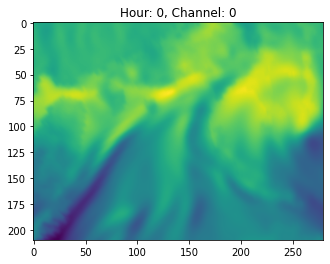

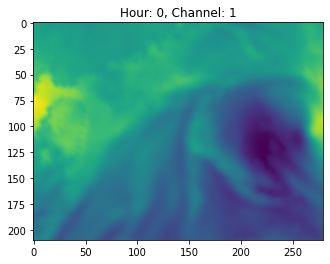

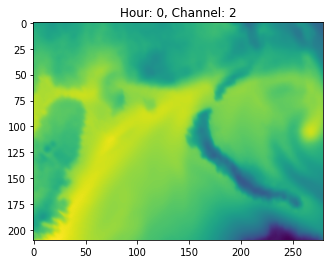

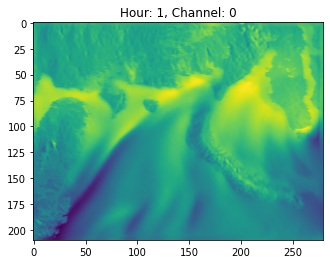

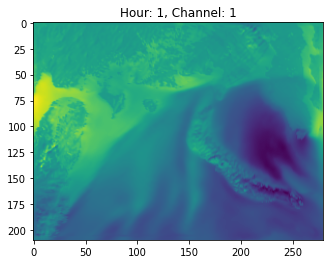

...

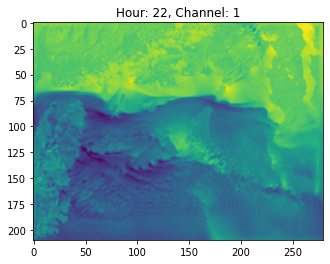

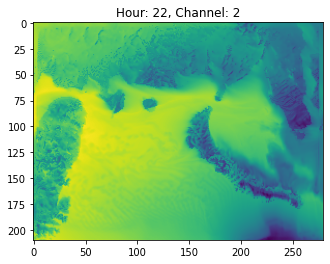

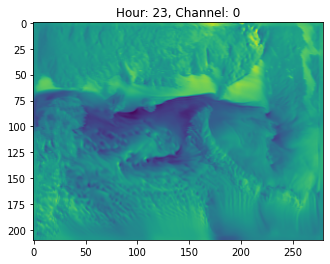

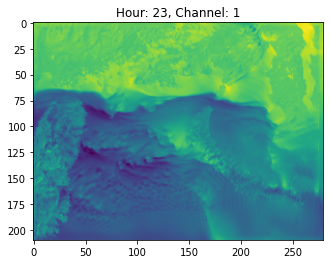

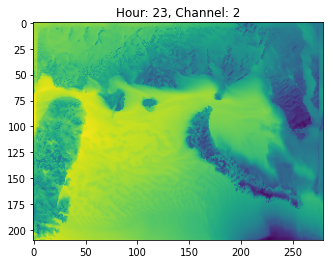

In [25]:
import numpy as np
import matplotlib.pyplot as plt

data = np.load('/home/jupyter/datasphere/project/train/wrf/wrfout_d01_2019-01-01_00%3A00%3A00.npy')

# Пройдемся по каждому часу суток
for hour in range(24):
    # Пройдемся по каждому каналу данных
    for channel_index in range(3):
        # Получим срез для текущего часа и канала
        slice_data = data[hour, channel_index]
        
        # Ваш код для обработки данных (например, создание изображения)
        processed_data = slice_data  # просто для примера

        # Визуализация
        plt.imshow(processed_data, cmap='viridis')
        plt.title(f'Hour: {hour}, Channel: {channel_index}')
        plt.show()

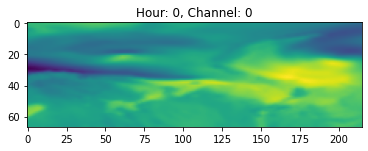

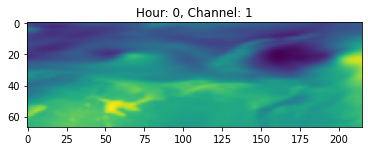

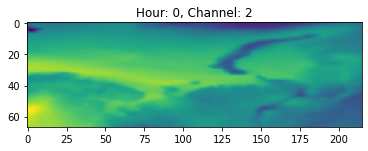

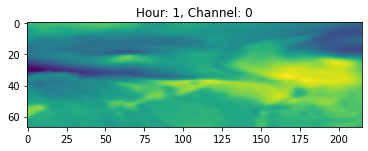

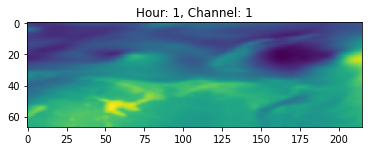

...

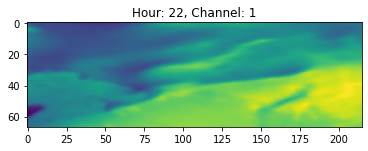

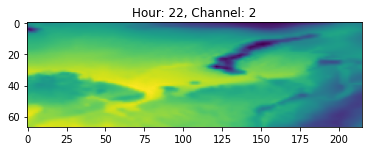

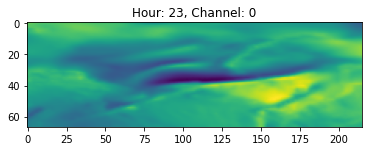

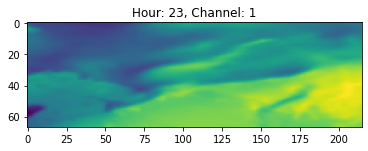

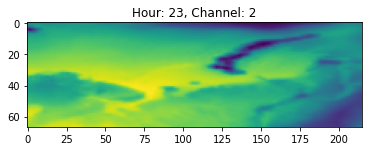

In [16]:
data_era = np.load('/home/jupyter/datasphere/project/train/era5/era_uv10_t2_2019-01-01.npy')
# data
# Предположим, что у вас есть массив данных из файла
# Замените эту строку на загрузку данных из ваших файлов
#data = np.random.rand(24, 3, 210, 280)

# Пройдемся по каждому часу суток
for hour in range(24):
    # Пройдемся по каждому каналу данных
    for channel_index in range(3):
        # Получим срез для текущего часа и канала
        slice_data_era = data_era[hour, channel_index]

        # Ваш код для обработки данных (например, создание изображения)
        processed_data_era = slice_data_era  # просто для примера

        # Визуализация
        plt.imshow(processed_data_era, cmap='viridis')
        plt.title(f'Hour: {hour}, Channel: {channel_index}')
        plt.show()